In [4]:
import pandas as pd

# Load the dataset
df = pd.read_csv('../data/raw/UNCLEANED_2.csv')

# List of numerical columns
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns

# Descriptive statistics
df[numerical_features].describe().transpose()


/var/folders/b_/y_jk5_7x3fvccjvy28hp6r640000gn/T/ipykernel_95881/2423847351.py:4: DtypeWarning: Columns (259,283,307) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('../data/raw/UNCLEANED_2.csv')


,count,mean,std,min,25%,50%,75%,max
result,13532.0,0.495270,0.499996,0.000000,0.000000,0.0,1.000000,1.000000
total_comp_time,13532.0,623.440955,367.403760,5.000000,265.000000,773.0,900.000000,2160.000000
round,13532.0,2.310893,1.018601,1.000000,1.000000,3.0,3.000000,5.000000
reach,12057.0,72.139587,4.174607,58.000000,70.000000,72.0,75.000000,84.000000
height,13518.0,70.426542,3.480258,60.000000,68.000000,71.0,73.000000,83.000000
...,...,...,...,...,...,...,...,...
ground_strikes_accuracy,13513.0,42.448777,40.056486,0.000000,0.000000,50.0,78.947368,100.000000
takedowns_def,13513.0,72.927770,35.839750,0.000000,50.000000,100.0,100.000000,100.000000
reach_differential,11233.0,1.001018,0.045059,0.828947,0.972222,1.0,1.028571,1.206349
height_differential,13485.0,1.000753,0.036673,0.835443,0.973333,1.0,1.027397,1.196970


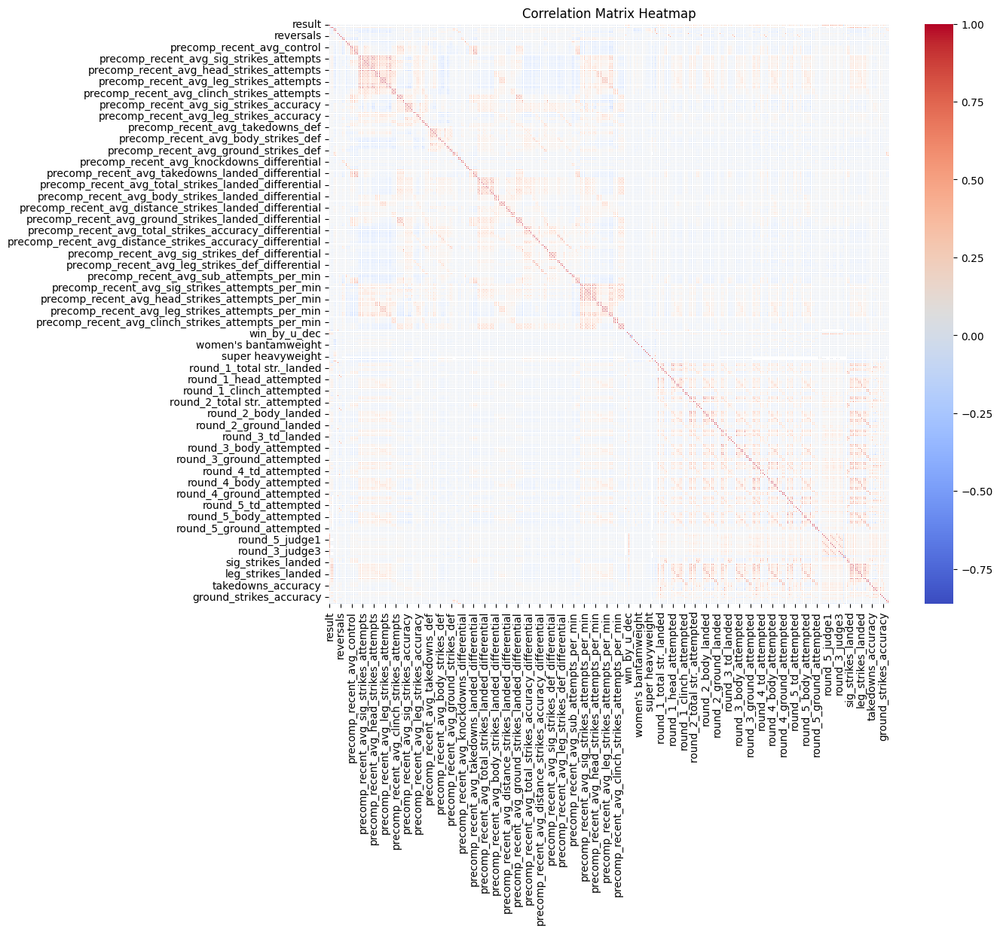

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Compute correlation matrix
corr_matrix = df[numerical_features].corr()

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [8]:
# Percentage of missing values per column
missing_percent = df.isnull().mean() * 100
missing_percent = missing_percent[missing_percent > 0].sort_values(ascending=False)
print(missing_percent)


round_4_judge2    97.428318
round_5_judge2    97.428318
round_5_judge1    97.428318
round_4_judge1    97.428318
round_4_judge3    97.398758
                    ...    
height             0.103458
location           0.007390
latitude           0.007390
longitude          0.007390
elevation          0.007390
Length: 382, dtype: float64


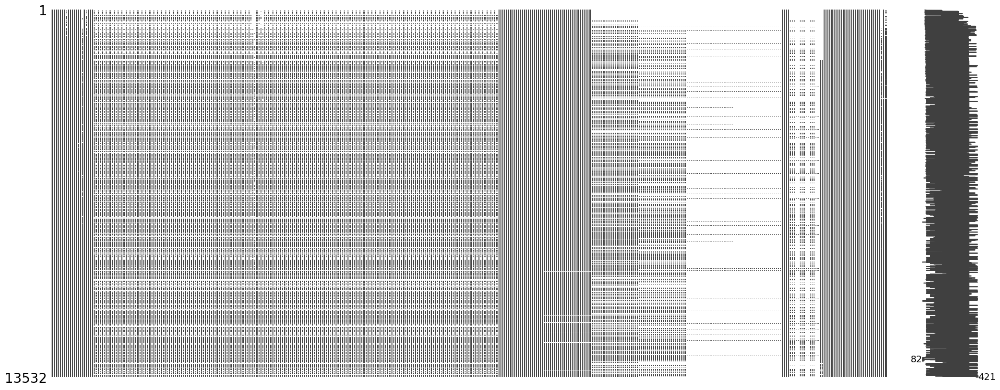

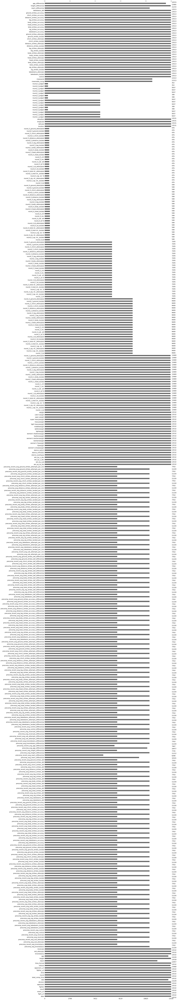

In [10]:
# Install missingno library if not already installed
# !pip install missingno

import missingno as msno

# Visualize missingness matrix
msno.matrix(df)
plt.show()

# Visualize missingness bar chart
msno.bar(df)
plt.show()

In [14]:
from sklearn.impute import KNNImputer

# Select numerical columns except those starting with 'round' or 'mean'
num_cols = [col for col in df.select_dtypes(include=['float64', 'int64']).columns
            if not (col.startswith('round') or col.startswith('mean'))]

# Initialize KNN Imputer
knn_imputer = KNNImputer(n_neighbors=5)

# Fit and transform the data
df[num_cols] = knn_imputer.fit_transform(df[num_cols])

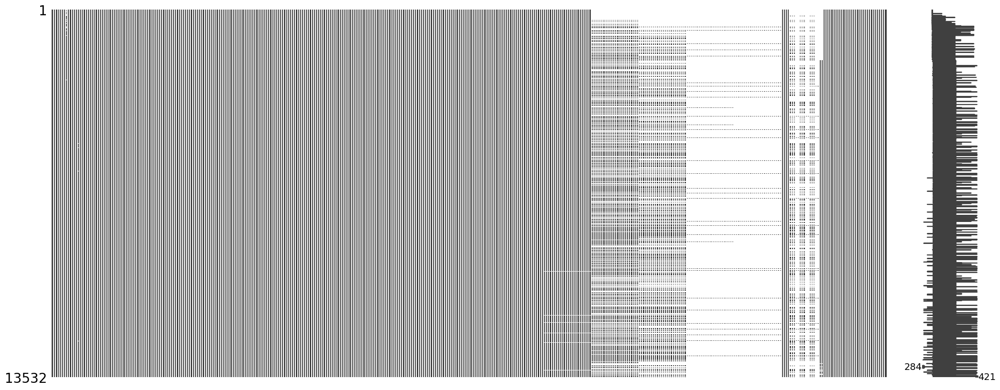

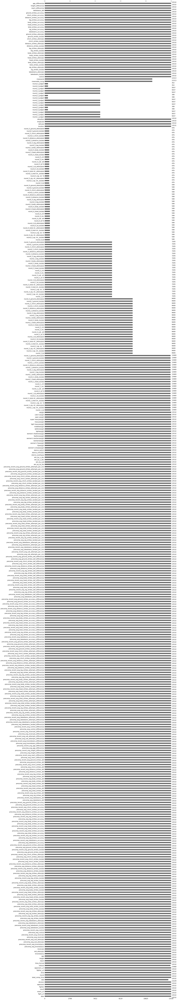

In [15]:
# Install missingno library if not already installed
# !pip install missingno

import missingno as msno

# Visualize missingness matrix
msno.matrix(df)
plt.show()

# Visualize missingness bar chart
msno.bar(df)
plt.show()

In [17]:
# Check if 'date' is already datetime
if not pd.api.types.is_datetime64_any_dtype(df['date']):
    print('Converting date to datetime')
    df['date'] = pd.to_datetime(df['date'])


In [ ]:
# Extract date components
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day
df['day_of_week'] = df['date'].dt.dayofweek

/var/folders/b_/y_jk5_7x3fvccjvy28hp6r640000gn/T/ipykernel_95881/2272830278.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['year'] = df['date'].dt.year
/var/folders/b_/y_jk5_7x3fvccjvy28hp6r640000gn/T/ipykernel_95881/2272830278.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['month'] = df['date'].dt.month
/var/folders/b_/y_jk5_7x3fvccjvy28hp6r640000gn/T/ipykernel_95881/2272830278.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has po

In [ ]:
# Sort by fighter and date
df = df.sort_values(['fighter', 'date'])

# Calculate the difference in days
df['days_since_last_fight'] = df.groupby('fighter')['date'].diff().dt.days

# Fill NaN values (first fight) with median days
df['days_since_last_fight'].fillna(df['days_since_last_fight'].median(), inplace=True)

/var/folders/b_/y_jk5_7x3fvccjvy28hp6r640000gn/T/ipykernel_95881/64751847.py:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['days_since_last_fight'].fillna(df['days_since_last_fight'].median(), inplace=True)


In [22]:
df['num_past_fights'] = df.groupby('fighter').cumcount()

In [23]:
# Calculate cumulative wins
df['cumulative_wins'] = df.groupby('fighter')['result'].cumsum() - df['result']

# Compute win-loss ratio
df['win_loss_ratio'] = df['cumulative_wins'] / df['num_past_fights']
df['win_loss_ratio'].fillna(0, inplace=True)

/var/folders/b_/y_jk5_7x3fvccjvy28hp6r640000gn/T/ipykernel_95881/392581649.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['win_loss_ratio'].fillna(0, inplace=True)


In [24]:
# Calculate BMI without adding extra columns
df['BMI'] = (df['weight'] * 0.453592) / ((df['height'] * 0.0254) ** 2)

In [25]:
df['physical_advantage'] = df['reach_differential'] + df['height_differential'] - df['age_differential']

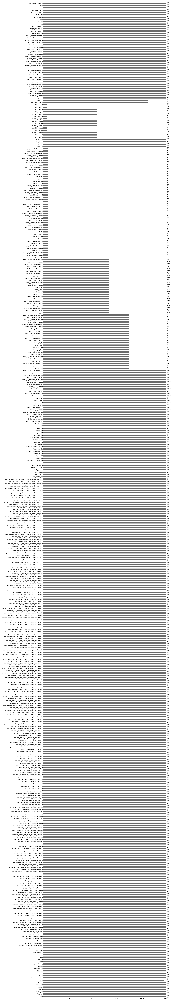

In [26]:
# Visualize missingness bar chart
msno.bar(df)
plt.show()

## MAKING AN ELO RATING SYSTEM

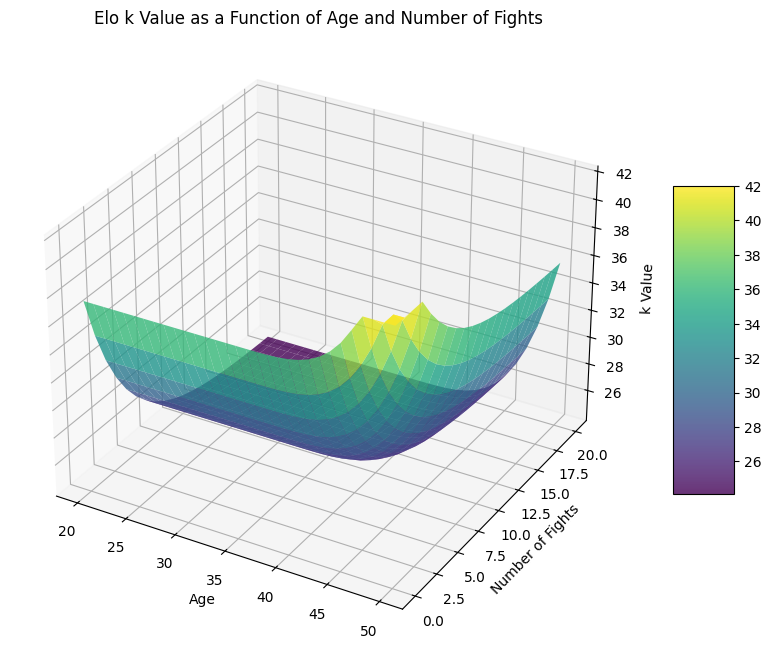

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import axes3d

# Adjustable constants
k_min = 24
k_max = 42
w_age = 0.65  # Weight for age component
w_fights = 0.75  # Weight for fights component
k2 = 0.25  # Fights decay constant

# New constants for adjusted age scaling
max_age = 50  # Upper age limit for scaling function (adjustable)
n = 4         # Exponent for age scaling (adjustable)

# Age and fights ranges
age_range = np.arange(20, max_age + 1)    # Ages from 20 to max_age
fights_range = np.arange(0, 20 + 1)       # Fights from 0 to 20

# Create meshgrid for age and fights
age_grid, fights_grid = np.meshgrid(age_range, fights_range)

# Adjusted S_age computation
S_age = np.where(
    age_grid <= 35,
    0,
    ((age_grid - 35) / (max_age - 35)) ** n
)

# Compute S_fights (unchanged)
S_fights = np.exp(-k2 * fights_grid)

# Compute k values
k_values = k_min + (k_max - k_min) * (w_age * S_age + w_fights * S_fights)

# Ensure k_values are within [k_min, k_max]
k_values = np.clip(k_values, k_min, k_max)

# Plotting
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Surface plot
surf = ax.plot_surface(
    age_grid, fights_grid, k_values,
    cmap=cm.viridis, edgecolor='none', alpha=0.8
)

# Labels and title
ax.set_xlabel('Age')
ax.set_ylabel('Number of Fights')
ax.set_zlabel('k Value')
ax.set_title('Elo k Value as a Function of Age and Number of Fights')

# Color bar
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()


In [50]:
import pandas as pd

# Assume df is your original DataFrame
# df = pd.read_csv('your_data.csv')

# Step 1: Create a copy of df with renamed columns
df_opponent = df.copy()

# Swap 'fighter' and 'opponent' in df_opponent
df_opponent.rename(columns={
    'fighter': 'opponent',
    'opponent': 'fighter',
    'age': 'opponent_age',
    'num_past_fights': 'opponent_num_past_fights',
    # Include any other fighter-specific columns that need to be swapped
}, inplace=True)

# Step 2: Merge df with df_opponent on 'fight_url', 'fighter', and 'opponent'
df = df.merge(
    df_opponent[['fight_url', 'fighter', 'opponent', 'opponent_age', 'opponent_num_past_fights']],
    on=['fight_url', 'fighter', 'opponent'],
    how='left'
)

# Now, df contains 'opponent_age' and 'opponent_num_past_fights' columns


In [95]:
# Adjustable constants
k_min = 24
k_max = 42
w_age = 0.1  # Weight for age component
w_fights = 1  # Weight for fights component
k2 = 0.8  # Fights decay constant

# New constants for adjusted age scaling
max_age = 50  # Upper age limit for scaling function (adjustable)
n = 1.2         # Exponent for age scaling (adjustable)

def compute_k_value(age, num_past_fights):
    # Age scaling function S_age
    if age <= 35:
        S_age = 0
    else:
        S_age = ((age - 35) / (max_age - 35)) ** n

    # Fights scaling function S_fights
    S_fights = np.exp(-k2 * num_past_fights)

    # Compute k value
    k = k_min + (k_max - k_min) * (w_age * S_age + w_fights * S_fights)
    # Ensure k is within [k_min, k_max]
    k = np.clip(k, k_min, k_max)

    return k

# Initial Elo rating
initial_elo = 1500

# Create a dictionary to store the Elo ratings
elo_ratings = {}

# Extract unique fighter names
fighters = pd.unique(df[['fighter', 'opponent']].values.ravel('K'))

# Initialize ratings for all fighters
for fighter in fighters:
    elo_ratings[fighter] = initial_elo


# Create lists to store the pre-fight ratings and rating differentials
pre_fight_elo_fighter = []
pre_fight_elo_opponent = []
rating_differentials = []

# Loop over each fight
for index, row in df.iterrows():
    fighter = row['fighter']
    opponent = row['opponent']
    result = row['result']  # 1 if fighter won, 0 if lost

    # Get the age and num_past_fights for both fighters
    age_fighter = row['age']
    num_past_fights_fighter = row['num_past_fights']

    # For the opponent, you need to have their age and num_past_fights
    # If you have this information in your DataFrame, make sure to include it
    # For this example, I'll assume you have 'opponent_age' and 'opponent_num_past_fights' columns
    age_opponent = row['opponent_age']
    num_past_fights_opponent = row['opponent_num_past_fights']

    # Compute k-values for both fighters
    k_fighter = compute_k_value(age_fighter, num_past_fights_fighter)
    k_opponent = compute_k_value(age_opponent, num_past_fights_opponent)

    # Get pre-fight Elo ratings
    elo_fighter = elo_ratings.get(fighter, initial_elo)
    elo_opponent = elo_ratings.get(opponent, initial_elo)

    # Record pre-fight ratings
    pre_fight_elo_fighter.append(elo_fighter)
    pre_fight_elo_opponent.append(elo_opponent)
    rating_differentials.append(elo_fighter - elo_opponent)

    # Compute expected scores
    expected_score_fighter = 1 / (1 + 10 ** ((elo_opponent - elo_fighter) / 400))
    expected_score_opponent = 1 - expected_score_fighter

    # Actual scores
    actual_score_fighter = result
    actual_score_opponent = 1 - result

    # Update Elo ratings
    elo_fighter_new = elo_fighter + k_fighter * (actual_score_fighter - expected_score_fighter)
    elo_opponent_new = elo_opponent + k_opponent * (actual_score_opponent - expected_score_opponent)

    # Update the ratings in the dictionary
    elo_ratings[fighter] = elo_fighter_new
    elo_ratings[opponent] = elo_opponent_new

# Add the pre-fight Elo ratings and rating differentials to the DataFrame
df['pre_fight_elo_fighter'] = pre_fight_elo_fighter
df['pre_fight_elo_opponent'] = pre_fight_elo_opponent
df['rating_differential'] = rating_differentials


Top 10 Highest-Rated Fighters:
                  Fighter   Elo_Rating
1872         Royce Gracie  2059.819654
489            Dan Severn  1856.902342
1092            Jon Jones  1813.090130
1205         Kamaru Usman  1796.785618
758     Georges St-Pierre  1788.513814
602              Don Frye  1766.023698
1254  Khabib Nurmagomedov  1757.888610
1491         Max Holloway  1733.706930
864       Israel Adesanya  1729.206779
562    Demetrious Johnson  1728.395297


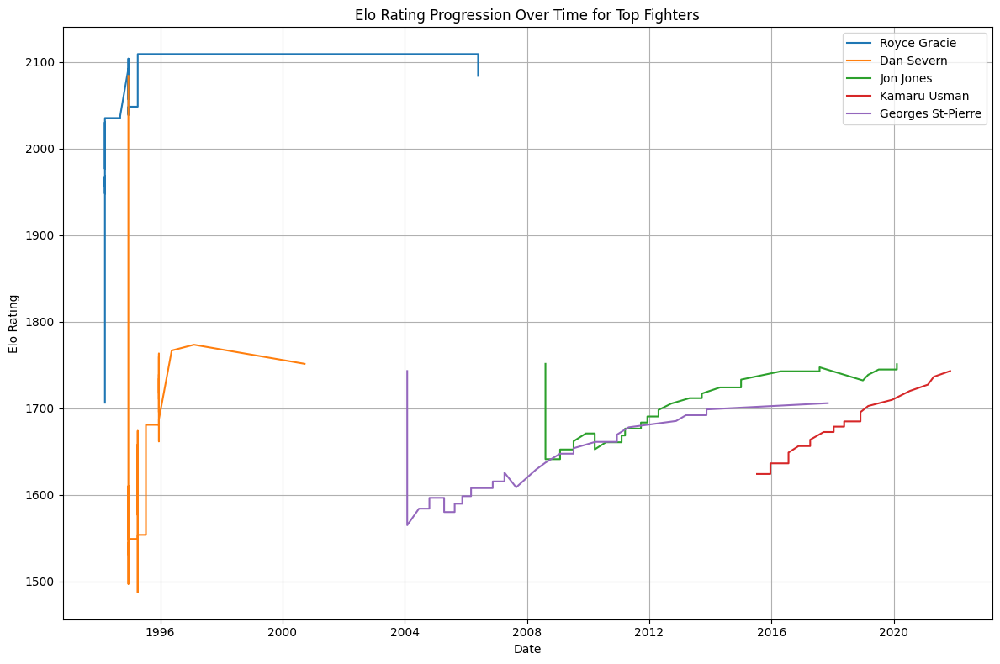

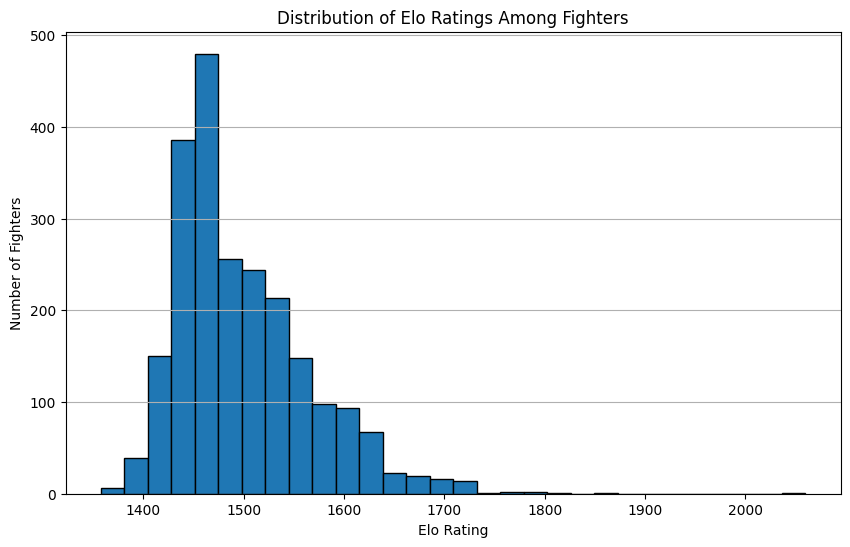

In [96]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have already run the Elo rating calculations

# 1. Convert the elo_ratings dictionary to a DataFrame
elo_df = pd.DataFrame(list(elo_ratings.items()), columns=['Fighter', 'Elo_Rating'])

# 2. Sort and display the top-rated fighters
top_fighters = elo_df.sort_values(by='Elo_Rating', ascending=False).head(10)
print("Top 10 Highest-Rated Fighters:")
print(top_fighters)

# 3. Plot Elo rating progression over time
# Ensure 'date' column is in datetime format
df['date'] = pd.to_datetime(df['date'])

# Plot Elo rating progression for top fighters
fighters_to_plot = top_fighters['Fighter'].tolist()[:5]

plt.figure(figsize=(12, 8))

for fighter in fighters_to_plot:
    # Filter the fights involving the fighter
    fighter_fights = df[(df['fighter'] == fighter) | (df['opponent'] == fighter)].copy()
    
    # Sort by date
    fighter_fights.sort_values(by='date', inplace=True)
    
    # Initialize lists to store dates and Elo ratings
    fight_dates = []
    elo_ratings_over_time = []
    
    # Loop through the fighter's fights to collect Elo ratings
    for index, row in fighter_fights.iterrows():
        if row['fighter'] == fighter:
            elo_rating = row['pre_fight_elo_fighter']
        # else:
        #     elo_rating = row['pre_fight_elo_opponent']
        
        fight_dates.append(row['date'])
        elo_ratings_over_time.append(elo_rating)
    
    # Plot the Elo ratings over time
    plt.plot(fight_dates, elo_ratings_over_time, label=fighter)

# Customize the plot
plt.xlabel('Date')
plt.ylabel('Elo Rating')
plt.title('Elo Rating Progression Over Time for Top Fighters')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 4. Plot the distribution of Elo ratings
plt.figure(figsize=(10, 6))
plt.hist(elo_df['Elo_Rating'], bins=30, edgecolor='black')
plt.xlabel('Elo Rating')
plt.ylabel('Number of Fighters')
plt.title('Distribution of Elo Ratings Among Fighters')
plt.grid(axis='y')
plt.show()
